# Plotting AFM images with insets all in one

In [27]:
from skimage import data, io, util, segmentation, color, draw, filters
import numpy as np
from scipy import ndimage
%matplotlib nbagg
import matplotlib as mpl
from matplotlib import cm,colors
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.pyplot as plt
from PIL import Image
import os 
import sys
import cv2
import pytesseract
from skimage import exposure
%reload_ext autoreload
%autoreload 2
%aimport AFM_lib

In [28]:
debug = True #or 'False' when you do not want to debug

# path = "/Users/sfiligoj/Google Drive/Crispies/Ru/Data analysis with Python/Pandas and Matplotlib - HHcorr, Basics and Images/DSP_all"
path = "/Users/sfiligoj/Desktop/Thesis/Data Analysis/AFM/SSP"
os.chdir(path)
filess= os.listdir()
filess = [f for f in filess if f.endswith('txt')]
new_folder_name = "ALL1"
if not os.path.exists(f"{new_folder_name}"):
    os.mkdir(f"{new_folder_name}")
print(f"Found {len(filess)} files")

Found 76 files


Plotting file: 0,Ru_H_asdep_FLAT.001.txt


<IPython.core.display.Javascript object>


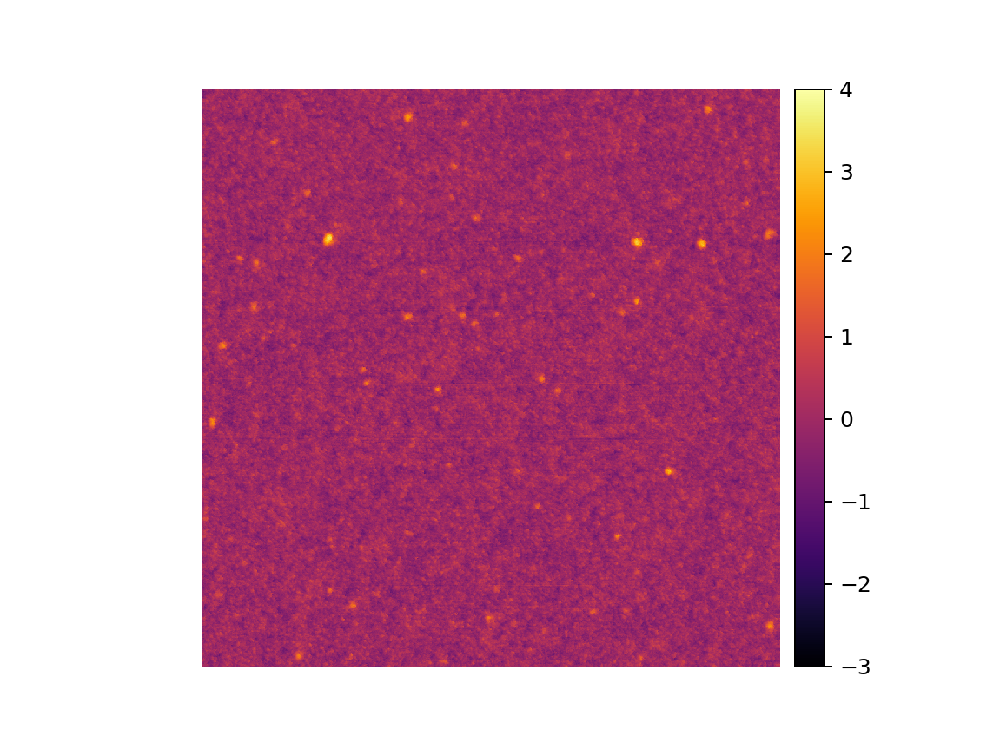

Plotting file: 1,Ru_H_700C_FLAT.031.txt


<IPython.core.display.Javascript object>


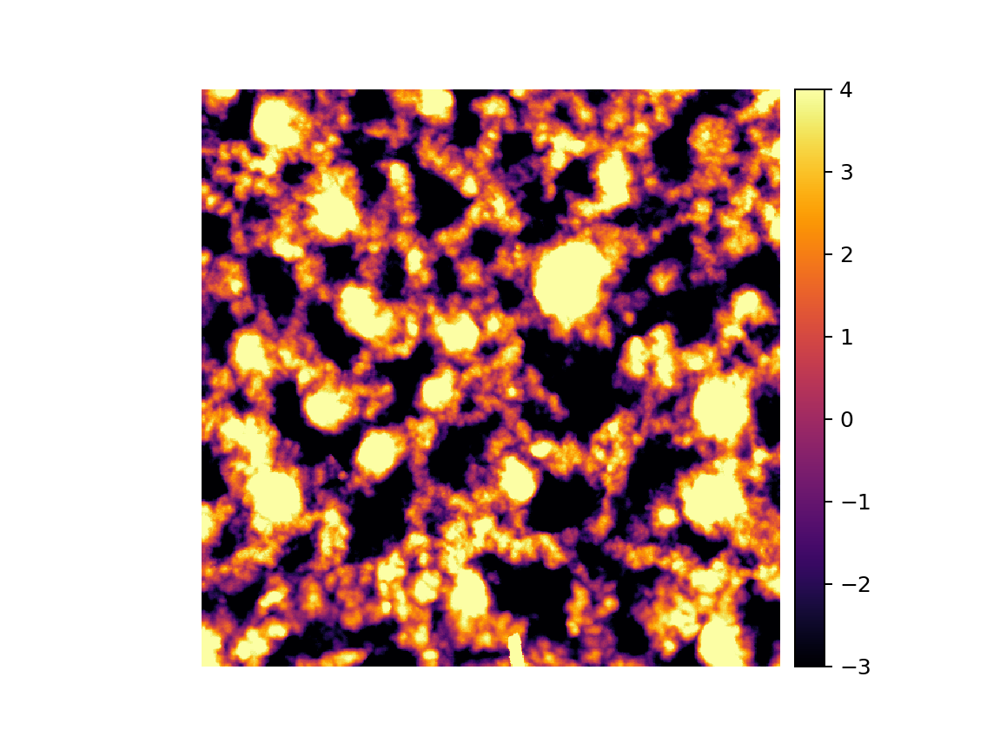

Plotting file: 3,Ru_H_500C_FLAT.004.txt


<IPython.core.display.Javascript object>


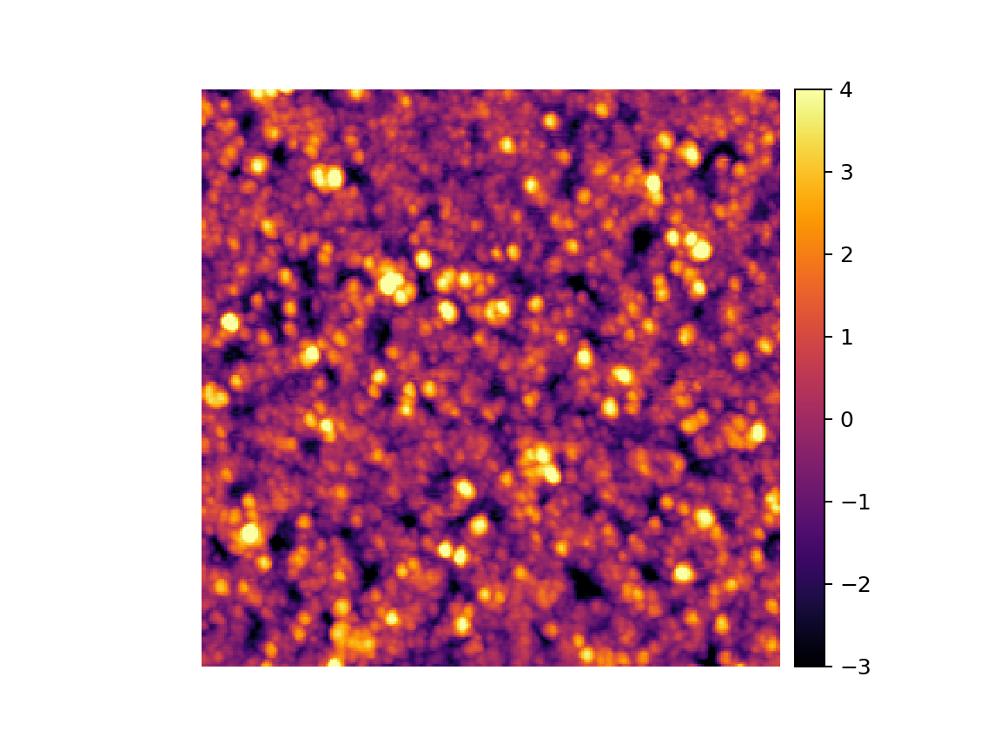

Plotting file: 5,Ru_H_asdep_FLAT.003.txt


<IPython.core.display.Javascript object>


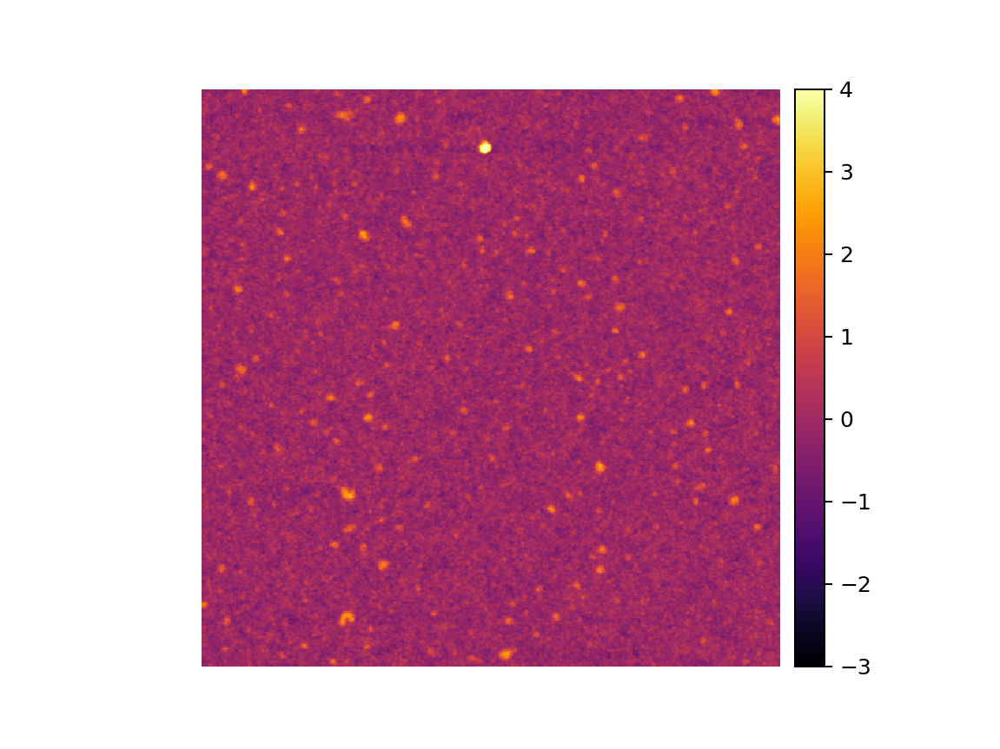

Plotting file: 8,Ru_H_500C_FLAT.003.txt


<IPython.core.display.Javascript object>


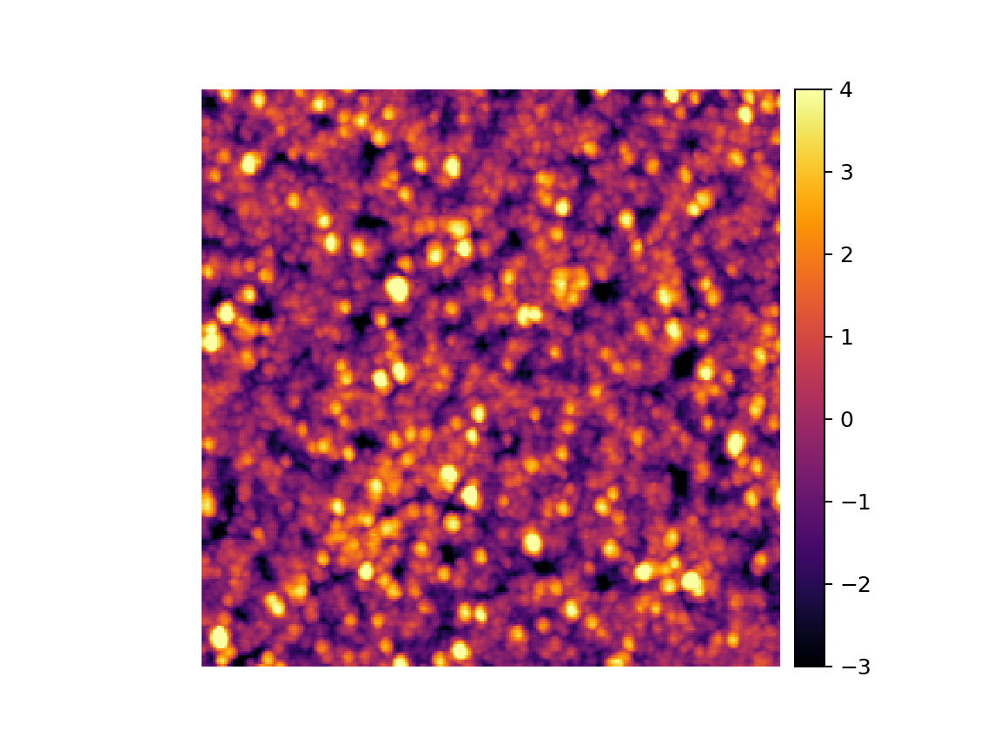

Plotting file: 10,Ru_H_700C_FLAT.022.txt


<IPython.core.display.Javascript object>


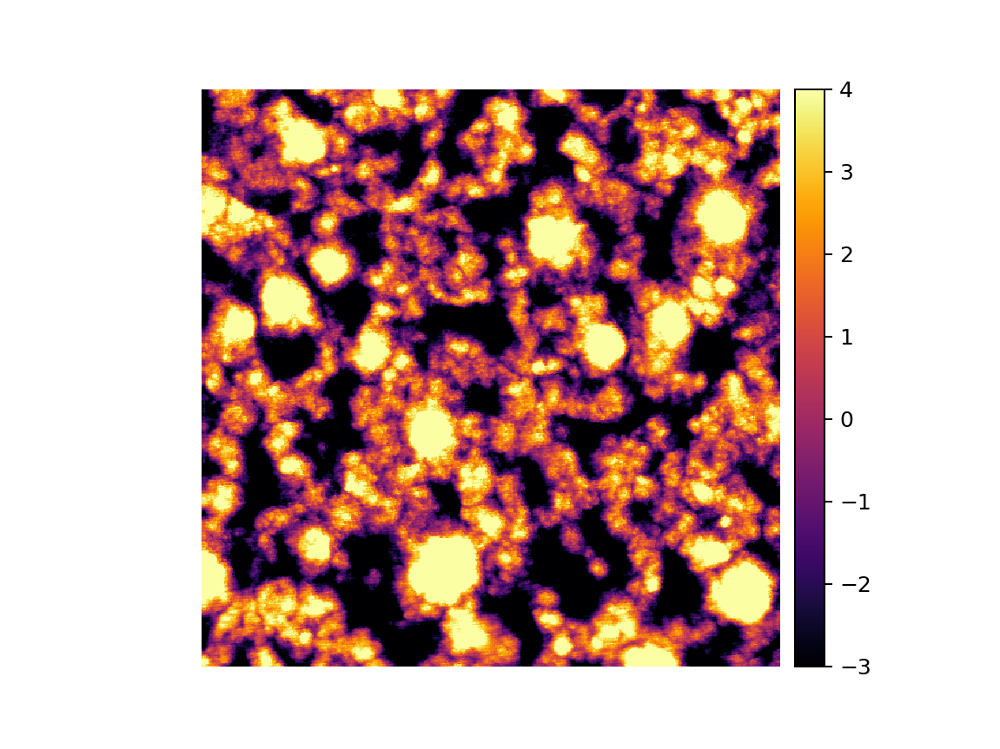

Plotting file: 12,Ru_H_800C_FLAT.008.txt


/anaconda3/envs/pina/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


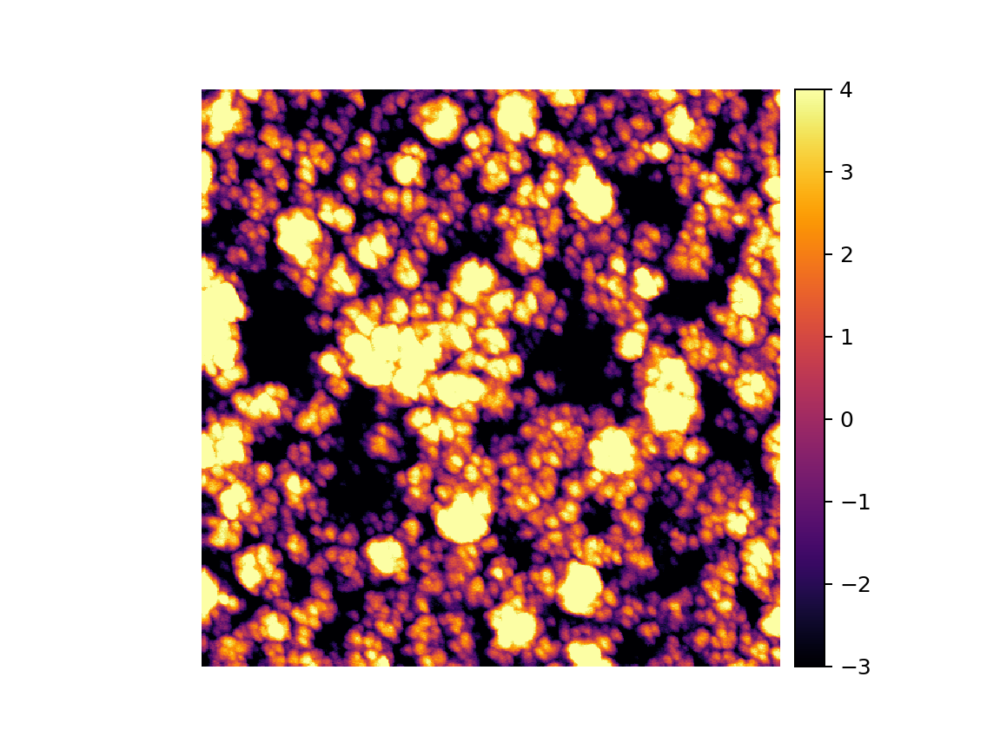

Plotting file: 14,Ru_H_500C_FLAT.002.txt


<IPython.core.display.Javascript object>


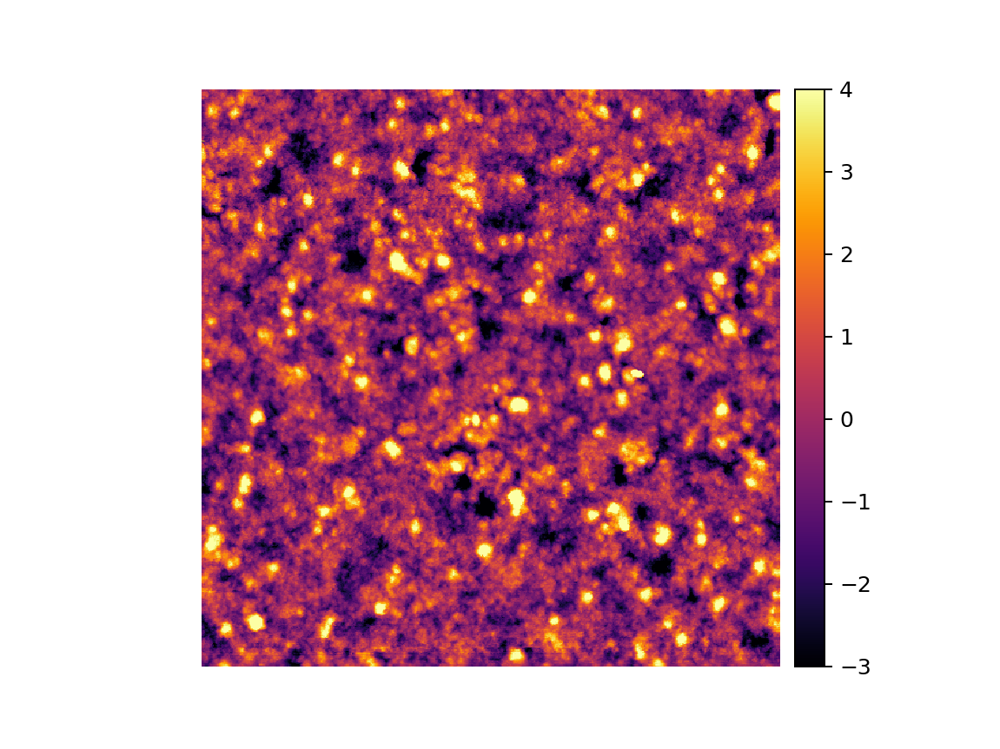

Plotting file: 18,Ru_H_asdep_500nm_FLAT.004.txt


<IPython.core.display.Javascript object>


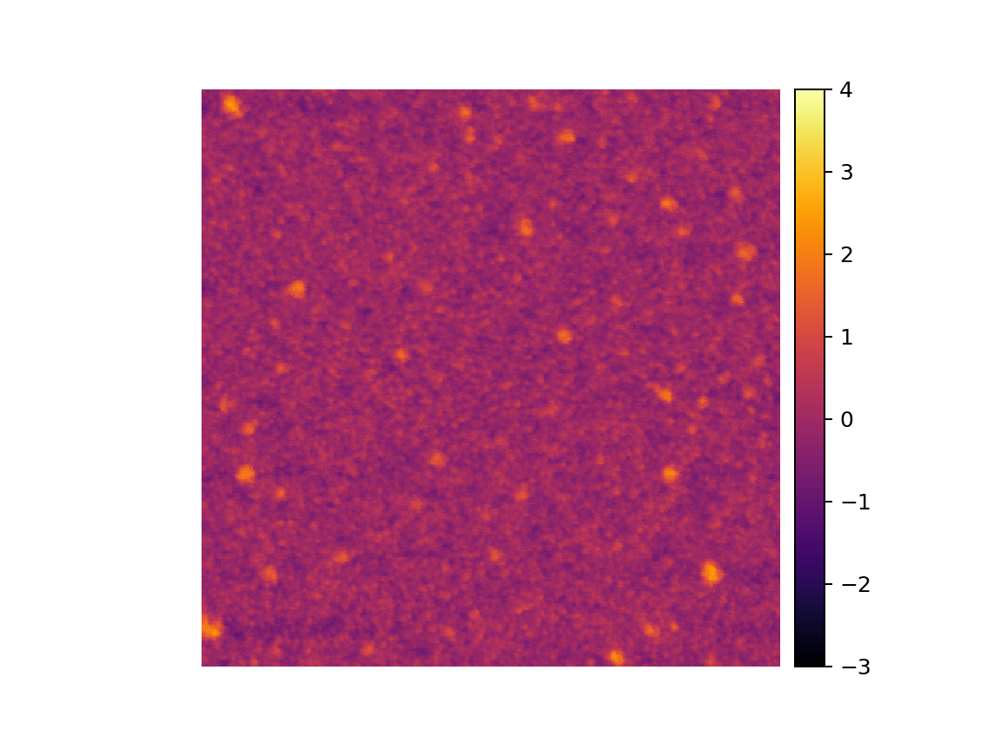

Plotting file: 22,Ru_H_asdep_200nm_FLAT_111.txt


<IPython.core.display.Javascript object>


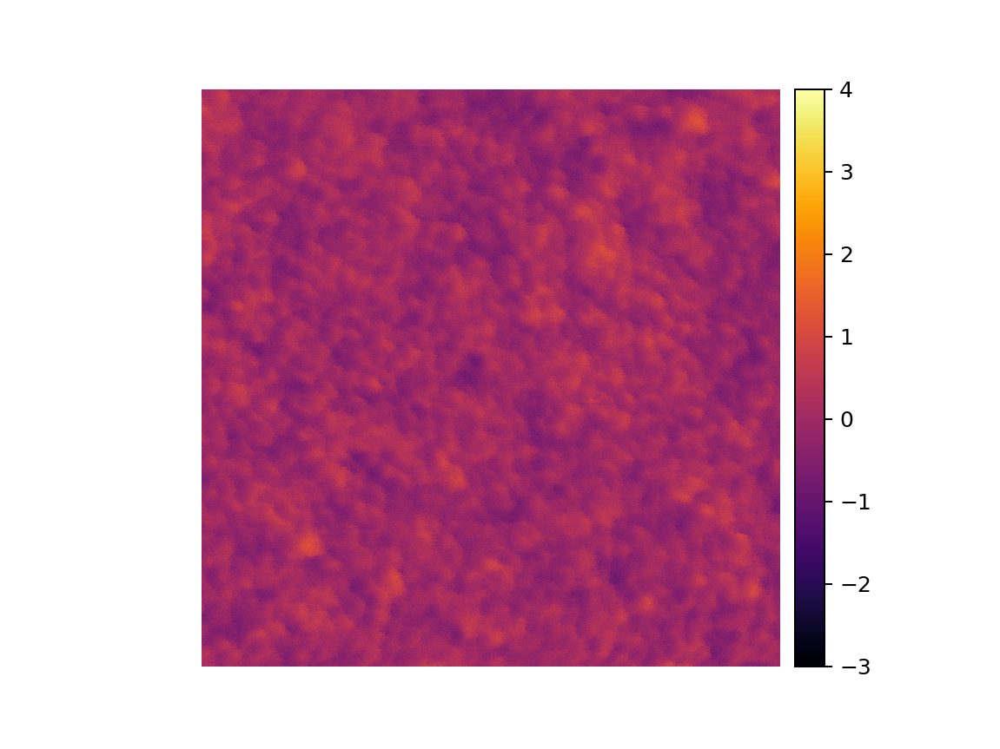

Plotting file: 24,Ru_H_asdep_FLAT.117.txt


<IPython.core.display.Javascript object>


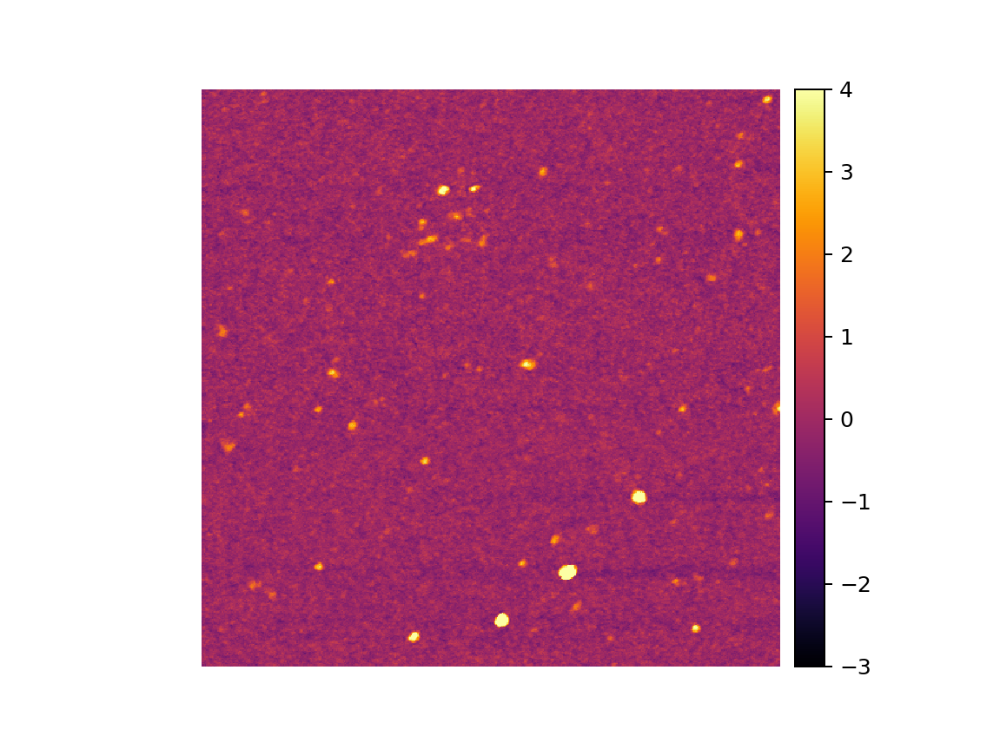

Plotting file: 27,Ru_H_600C_FLAT.021.txt


<IPython.core.display.Javascript object>


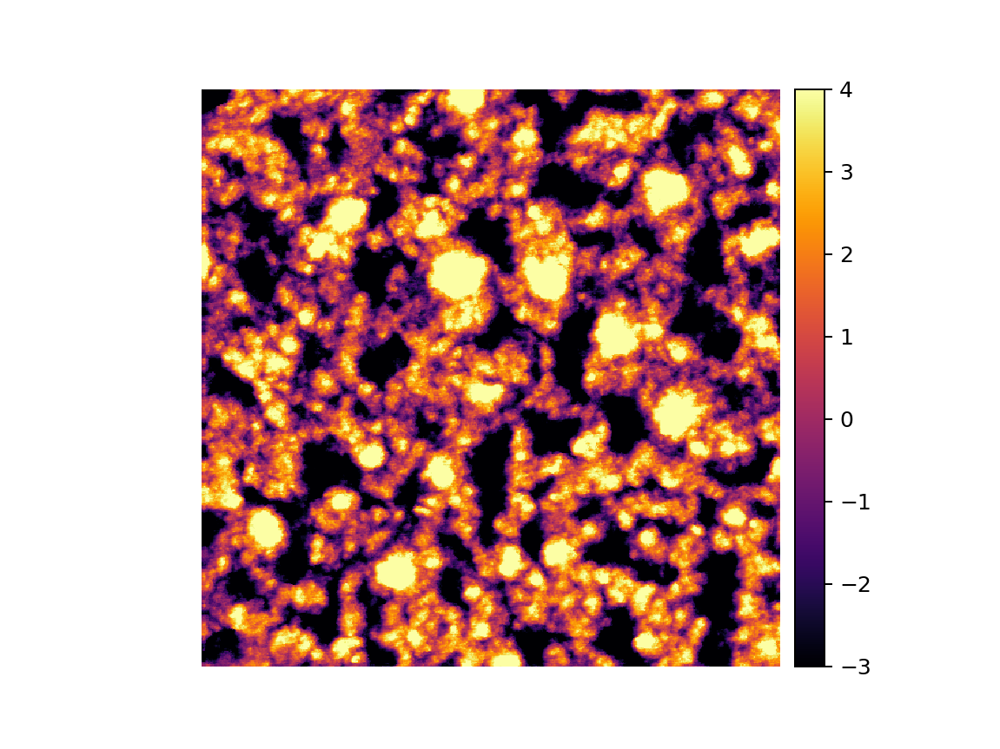

Plotting file: 29,Ru_H_600C_FLAT.025.txt


<IPython.core.display.Javascript object>


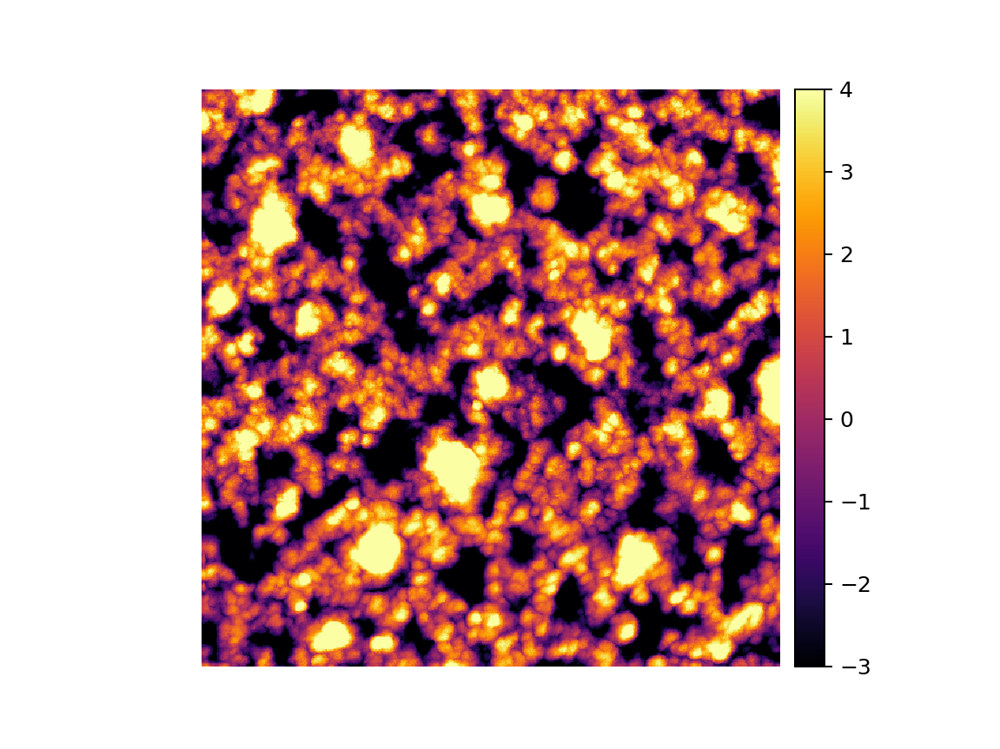

Plotting file: 30,Ru_H_250C_FLAT.015.txt


<IPython.core.display.Javascript object>


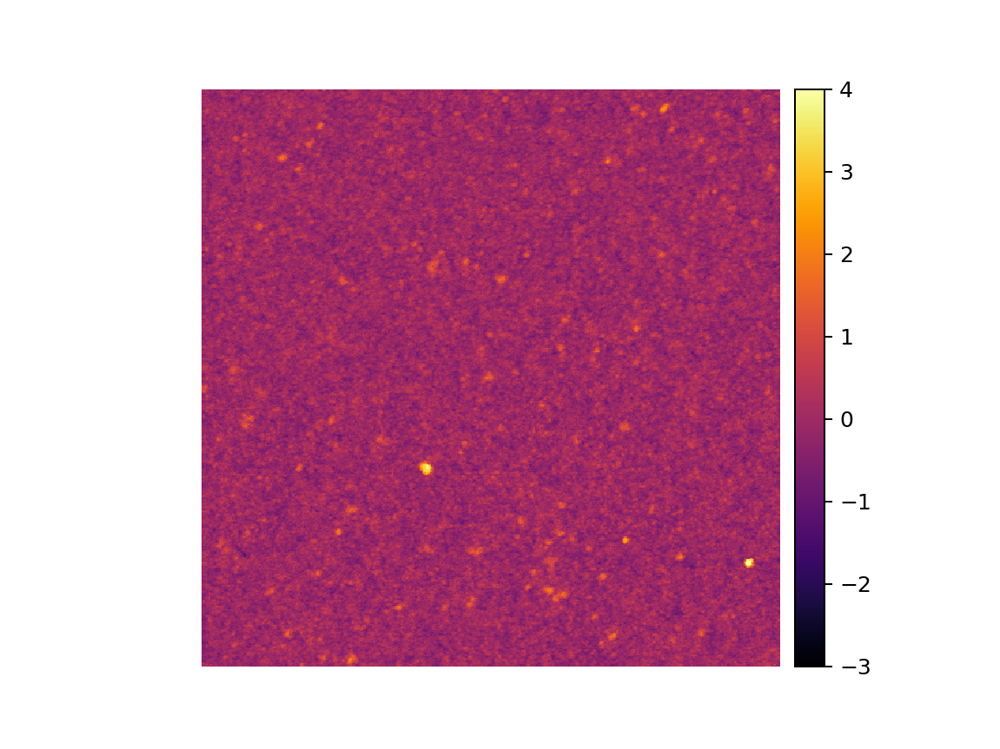

Plotting file: 33,Ru_H_600C_FLAT.026.txt


<IPython.core.display.Javascript object>


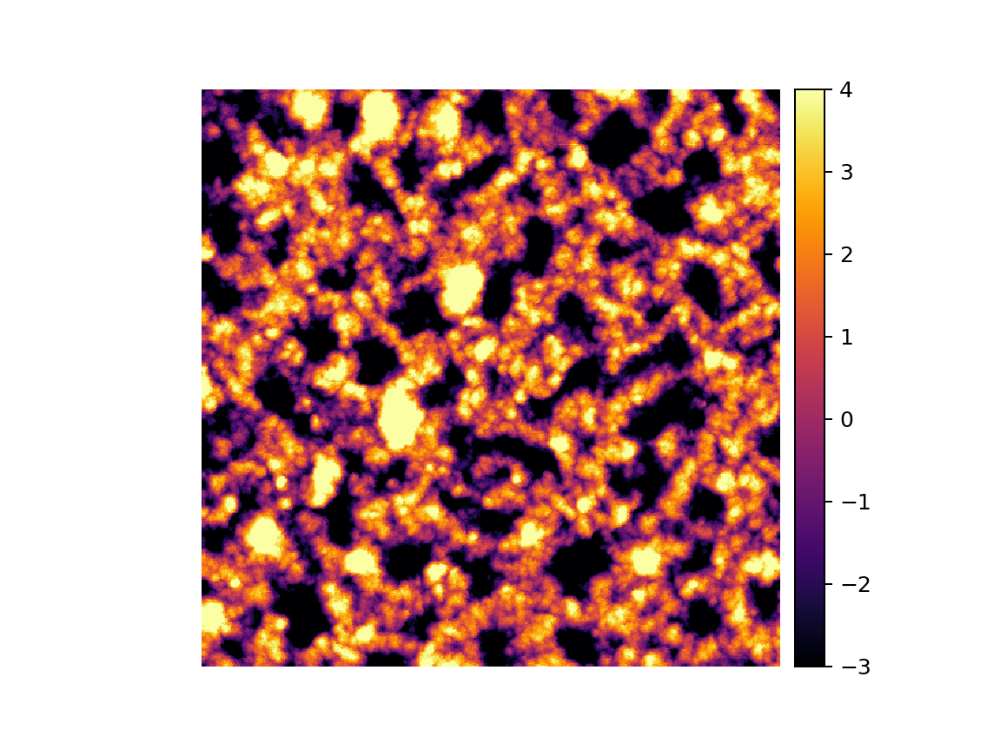

Plotting file: 34,Ru_H_250C_FLAT.016.txt


<IPython.core.display.Javascript object>


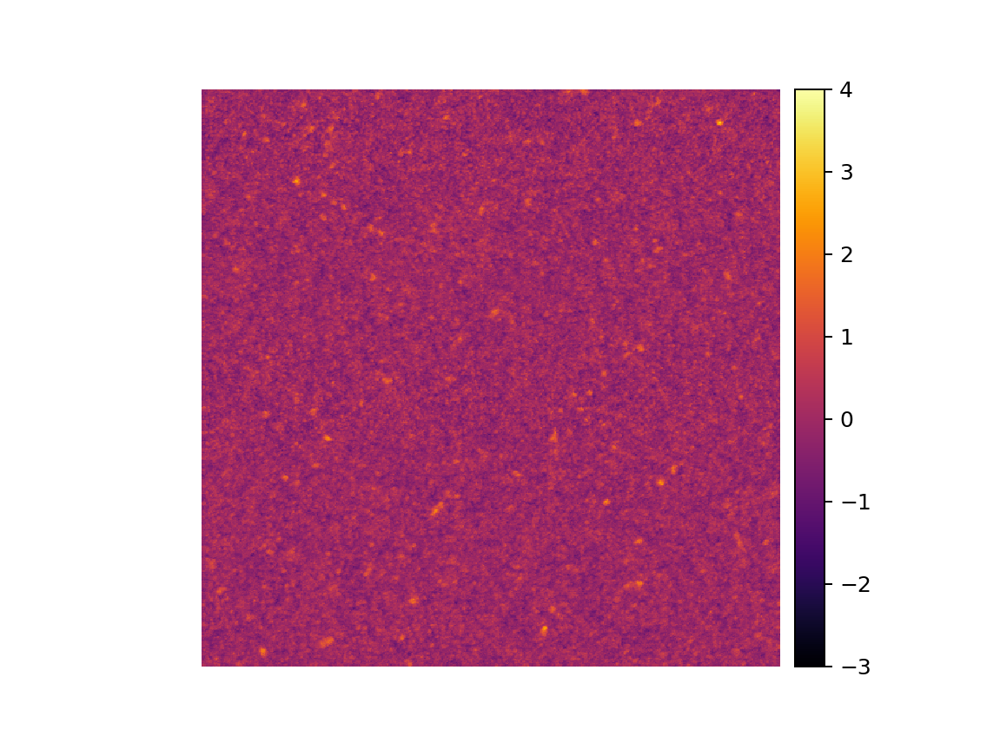

Plotting file: 38,Ru_H_250C_FLAT.003.txt


<IPython.core.display.Javascript object>


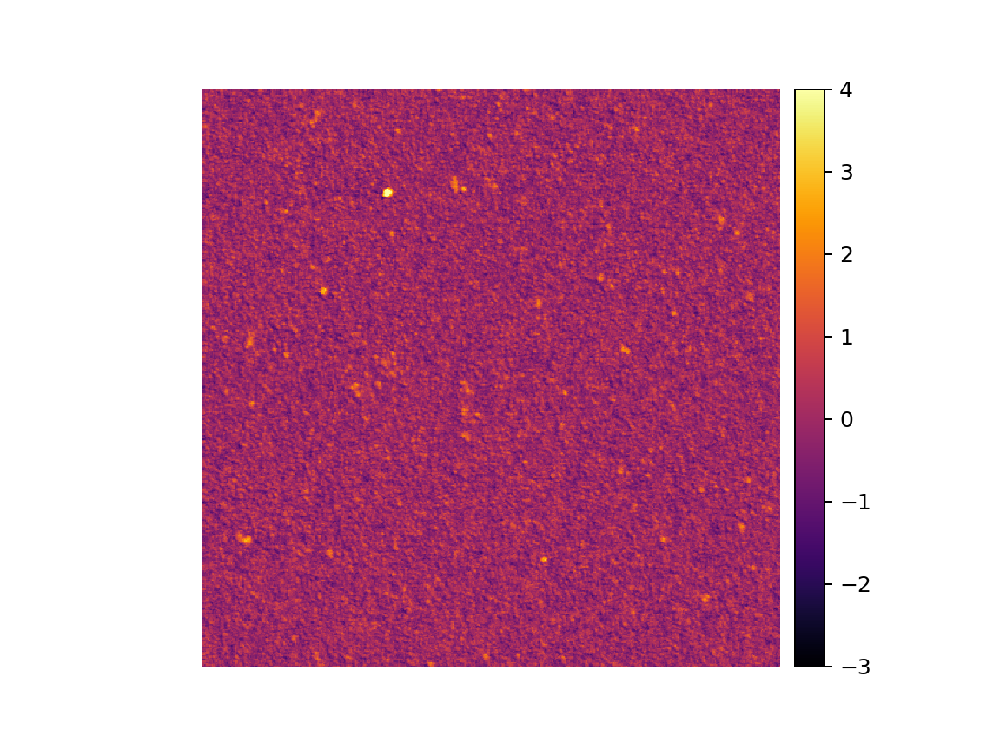

Plotting file: 57,Ru_H_600C_FLAT.006.txt


<IPython.core.display.Javascript object>


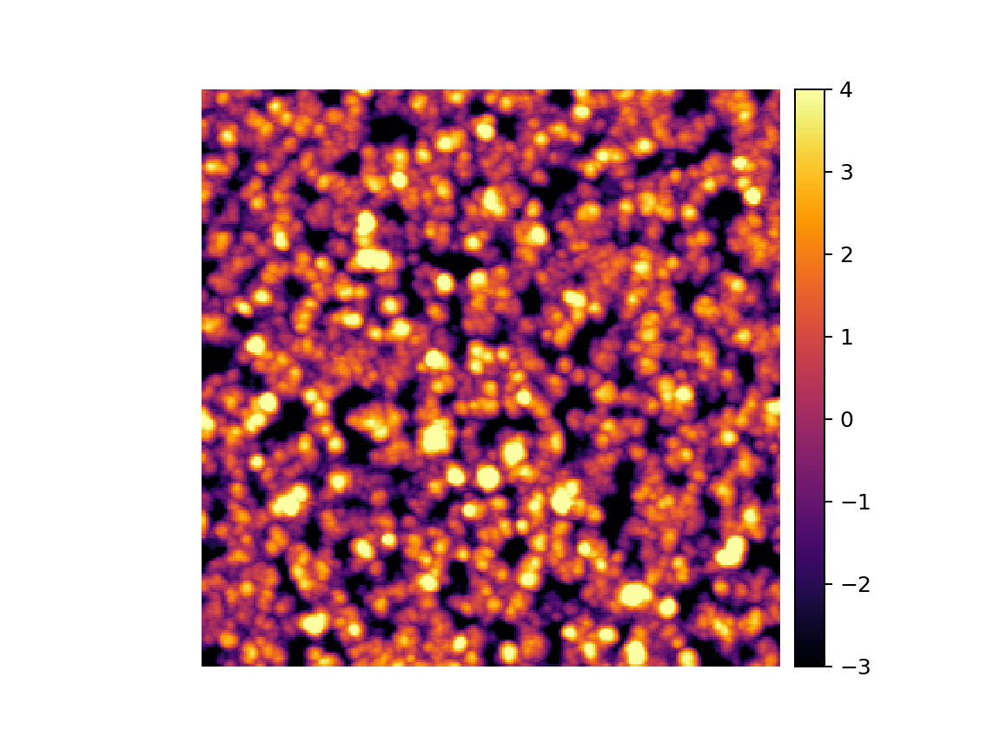

Plotting file: 60,Ru_H_700C_FLAT.010.txt


<IPython.core.display.Javascript object>


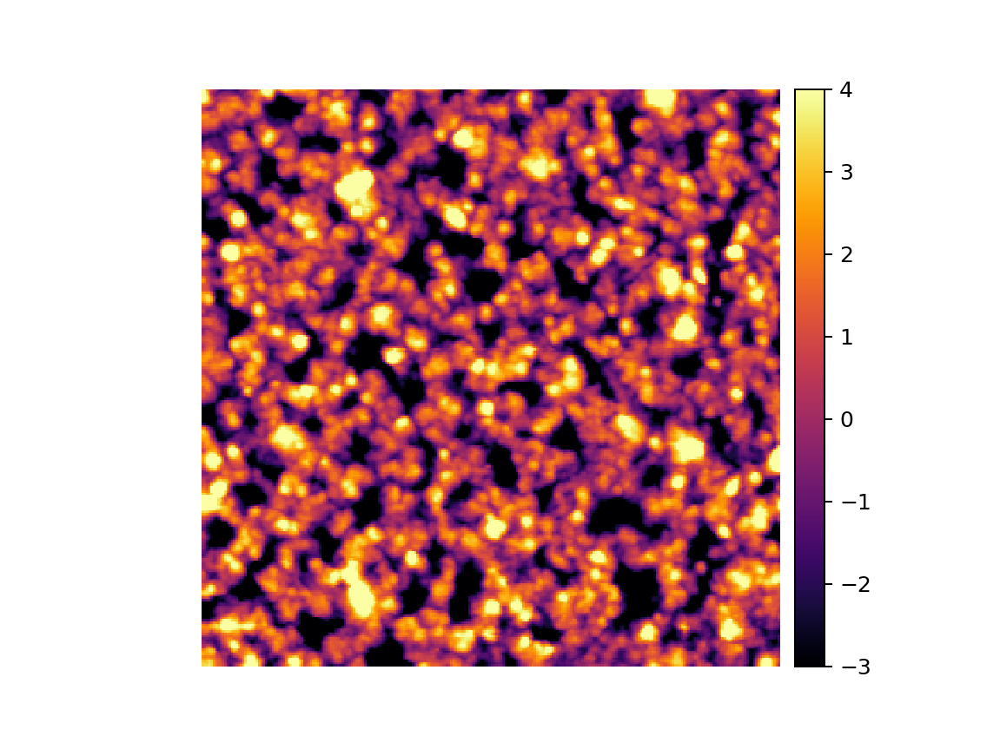

Plotting file: 61,Ru_H_700C_FLAT.011.txt


<IPython.core.display.Javascript object>


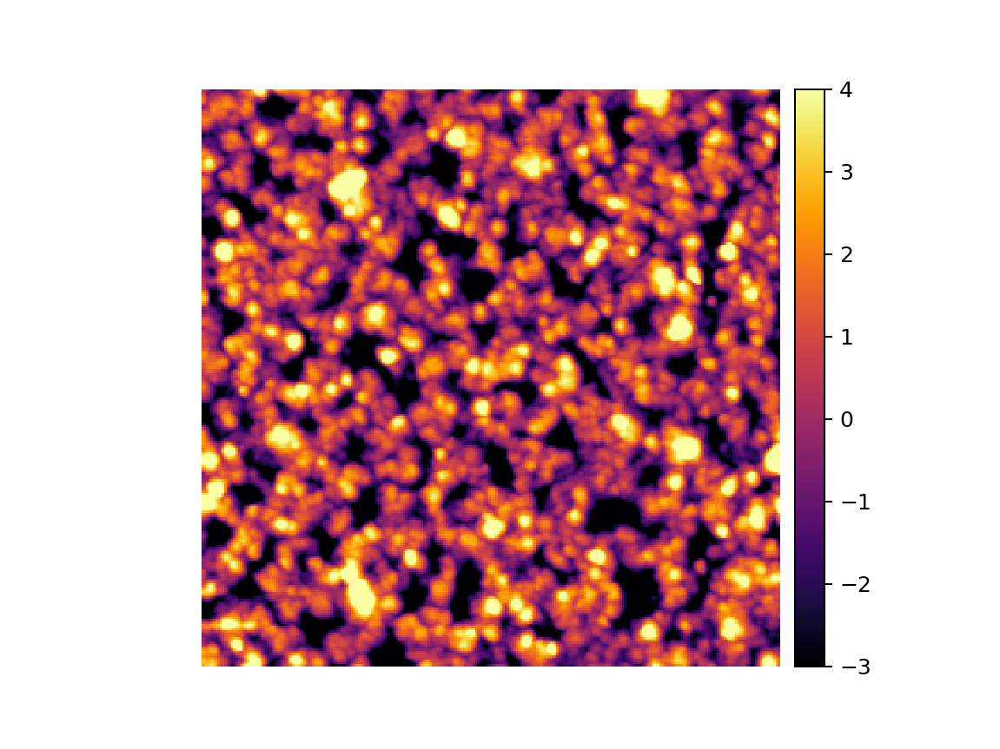

Plotting file: 62,Ru_H_700C_500nm_FLAT.012.txt


<IPython.core.display.Javascript object>


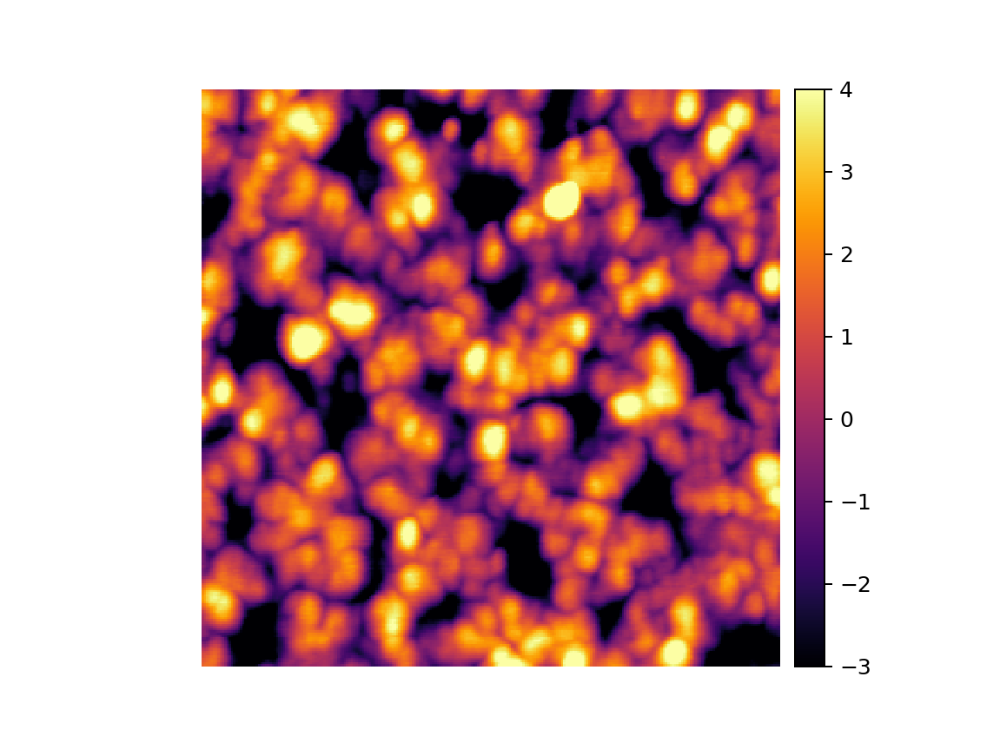

Plotting file: 65,Ru_H_800C_FLAT.010.txt


<IPython.core.display.Javascript object>


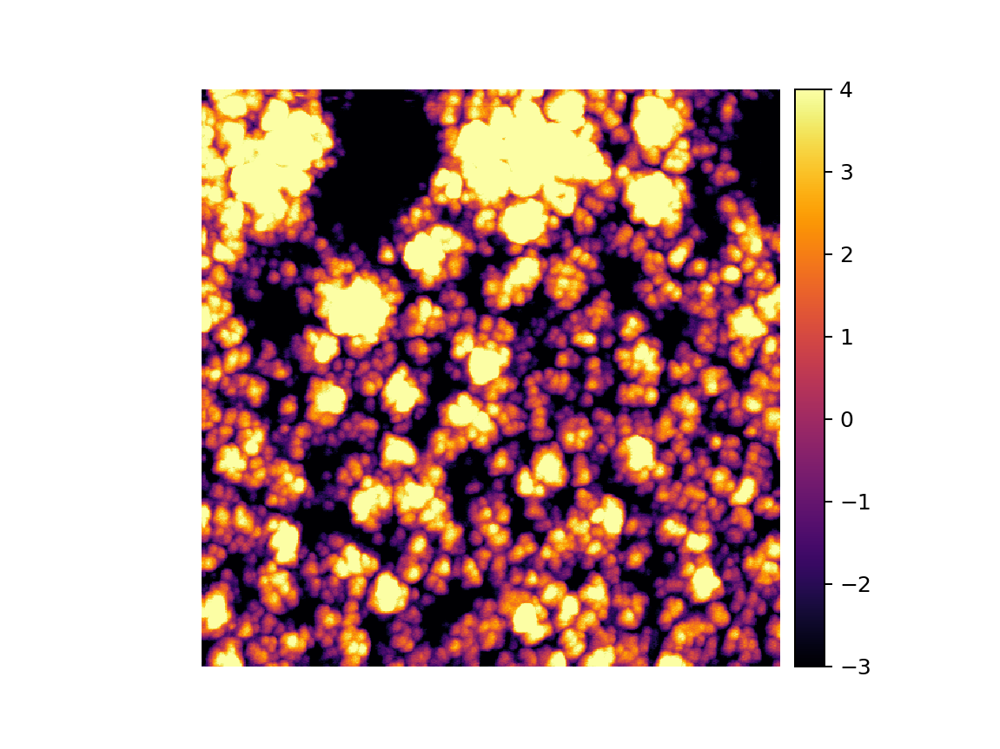

Plotting file: 66,Ru_H_500C_FLAT.022.txt


<IPython.core.display.Javascript object>


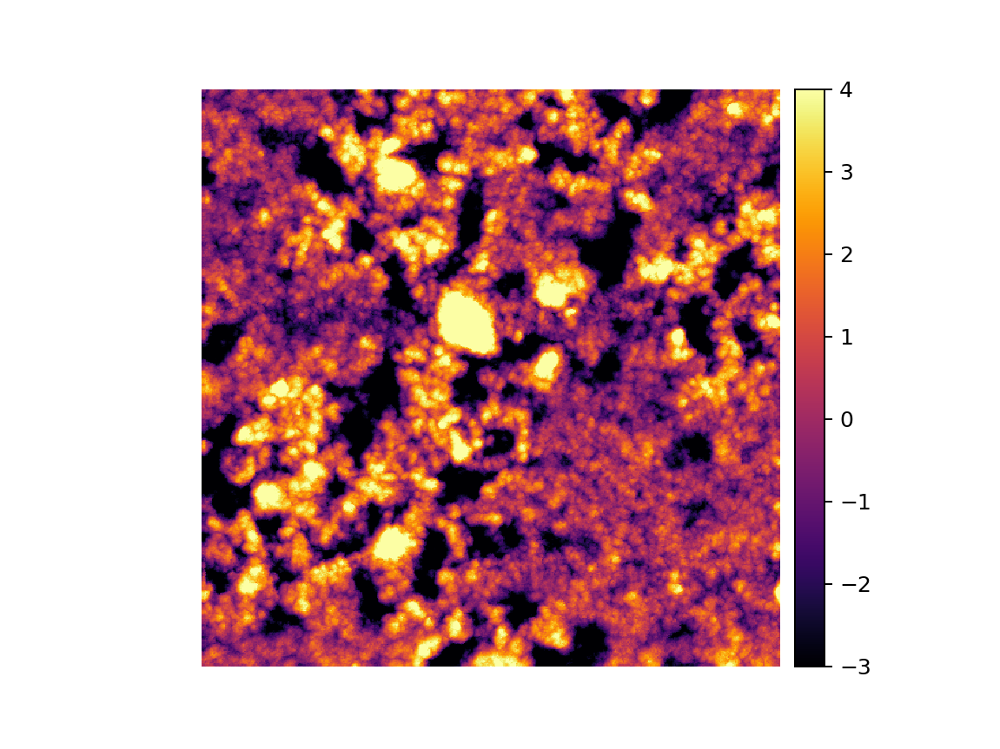

Plotting file: 68,Ru_H_500C_FLAT.023.txt


<IPython.core.display.Javascript object>


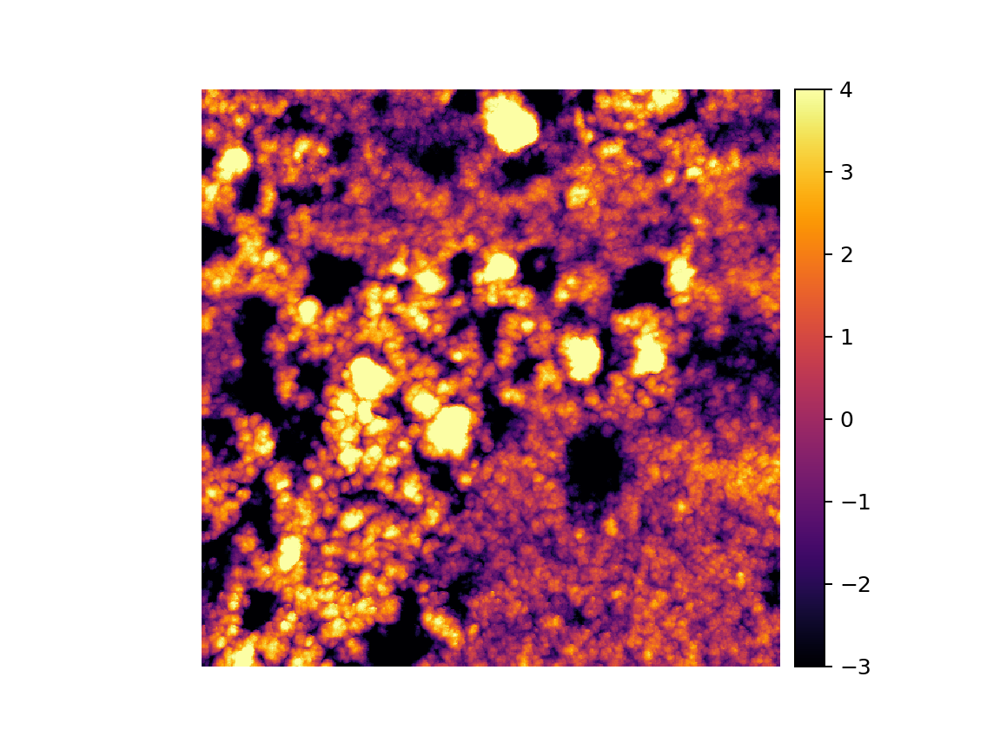

Plotting file: 75,Ru_H_800C_XPS_FLAT.033.txt


<IPython.core.display.Javascript object>


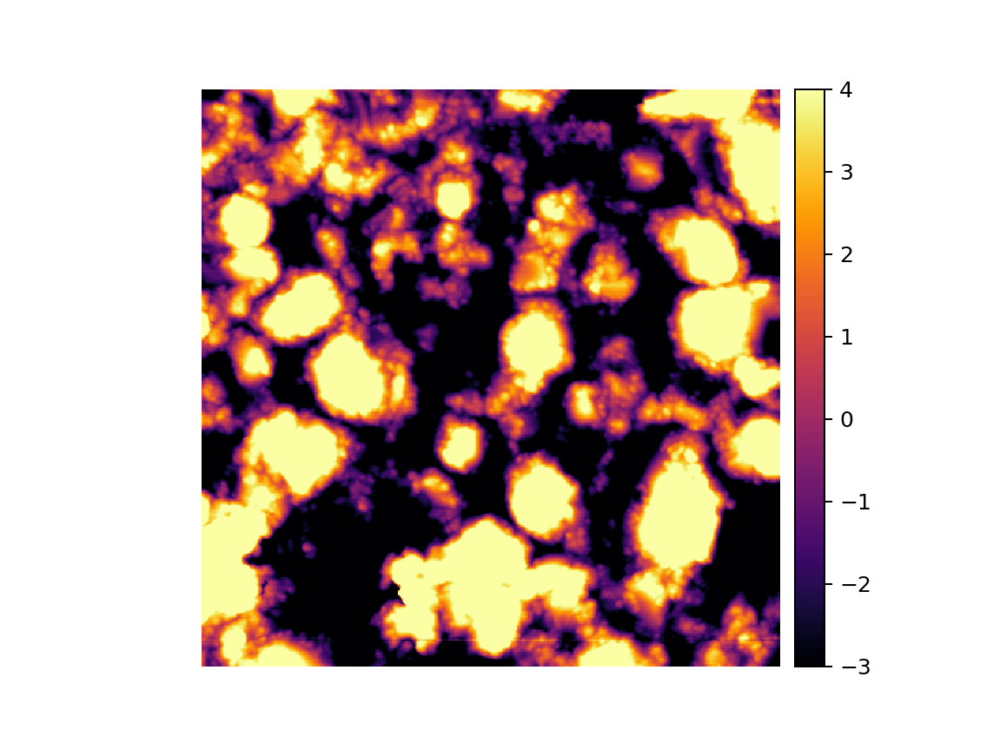

In [5]:

    
for i,file in enumerate(filess[:]):
    
    if '*' in file:
        continue   
    elif 'Ru_S_'in file:
        continue
    elif 'Si' in file:
        continue
        density = 'Si'
    elif 'um' in file:
        continue   
    elif '_LH_' in file:
        continue
        density = 'Low-High'
        if 'asdep' in file:
            temperature = 'asdep'
        else:
            continue
            temperature = temperature = file[5:9]        
    elif '_L_' in file:
        continue
        density = 'Low'
        if 'asdep' in file:
            temperature = 'asdep'
        else:
            continue
            temperature = temperature = file[5:9]          
    elif '_H_' in file:
#         continue
        density = 'High'
        if 'asdep' in file:
            temperature = 'asdep'
        else:
#             continue
            temperature = temperature = file[6:10]
            
    print(f"Plotting file: {i},{file}")
            
    filesize = os.path.getsize(file)     #to differentiate between 512x512 px or 1024x1024 px img
    Pix_width = int(np.sqrt(filesize/32))
    Pix_height = Pix_width

 
    img = np.genfromtxt(file, skip_header=1).reshape((Pix_width,Pix_height)) 
    
    #remove outliers:
    img_wo_outliers = AFM_lib.remove_outliers(img,threshold=3)   
    
    #***Take different colorbars for every image:

#     #Take contrast correction on image without outliers:
#     pI, pF = np.percentile(img_wo_outliers, (0.5, 98.5))        
#     #Apply contrast correction:
#     img_rescale = exposure.rescale_intensity(img, in_range=(pI, pF))
#     vmin = img.min()
#     vmax = img.max()

    #***Take the same colorbars for all images:  
    #Set maximum and minimum brightness:
    vmin = -3.0 #-7.0
    vmax = 4.0 #14.0
    
    #Apply the same contrast correction for all images:
#     img_rescale = exposure.rescale_intensity(img, in_range=(vmin, vmax))
    
    fig,ax = plt.subplots(1,1)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
     
    img2 = ax.imshow(img, cmap = 'inferno', norm = norm)
    cbar = fig.colorbar(img2, cax=cax, norm=norm)
    ax.axis('off')

    cbar.set_ticklabels([f"{vmin:.3} nm",f"{vmax:.3} nm"])
    
    fname = f'{file[:-4]}'
    plt.savefig(f"{new_folder_name}/{fname}_2.png", dpi=600) 
    plt.savefig(f"{new_folder_name}/{fname}_2.svg", dpi=600)